# ✌️ Chapter 4. Part 1: Logistic Regression

We will now begin the next section of our preparation, which focuses on Chapter 4. In this initial part of the chapter, we will explore `Logistic Regression`. So, let's go!

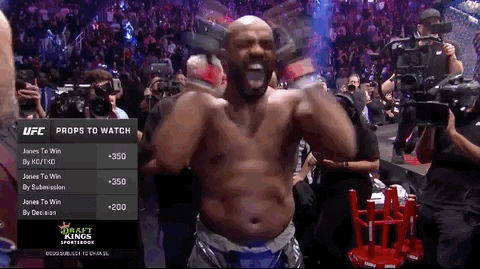

#### Chapter 4.3 [Read full chapter in ISLP]
#### 📚 Theory Summary

Unlike Linear Regression, which is used for predicting continuous outcomes, Logistic Regression is employed when the outcome variable is categorical or binary. It models the probability of a binary outcome by fitting the data to a logistic curve, allowing for classification tasks. Logistic Regression estimates the probability that a given input belongs to a certain category or class, making it a powerful tool for binary classification problems in various fields such as medicine, finance, and marketing.

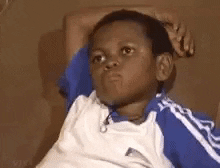

The `Logistic Function` is defined by:

$$
p(X) = \frac{e^{\beta_0 + \beta_1 X}}{1 + e^{\beta_0 + \beta_1 X}}
$$

by manipulating the formula further, we get

$$
\frac{p(x)}{1 - p(X)} = e^{\beta_0 + \beta_1 X}
$$

Linearizing this gives us the `Log Odds` or `Logil` function which is

$$
\log\left(\frac{p(X)}{1 - p(X)}\right) = \beta_0 + \beta_1 X

$$

#### Estimating the Regression Coefficients $\beta_0$ and $\beta_1$

To estimate the coeffitients, we will use the `Likelihood Function`

$$
𝓁(\beta_0, \beta_1) = \prod_{i:y_i = 1}p(x_i) \prod_{i^{'}:y_i^{'} = 0}(1 - p(x_{i^{'}}))
$$

## 📈 The Stock Market Data

In [1]:
import numpy as np
import pandas as pd
from matplotlib.pyplot import subplots
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.api as sm
from ISLP import load_data
from ISLP.models import (ModelSpec as MS ,summarize)

from ISLP import confusion_table
from ISLP.models import contrast
from sklearn.discriminant_analysis import \
    (LinearDiscriminantAnalysis as LDA ,
     QuadraticDiscriminantAnalysis as QDA)
from sklearn.naive_bayes import GaussianNB
from sklearn.neighbors import KNeighborsClassifier
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression

import warnings
warnings.filterwarnings("ignore")

In [2]:
# load Smarket data
Smarket = load_data('Smarket')
pd.DataFrame(Smarket.columns, columns=['Columns'])

,Columns
0,Year
1,Lag1
2,Lag2
3,Lag3
4,Lag4
5,Lag5
6,Volume
7,Today
8,Direction


In [3]:
Smarket.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1250 entries, 0 to 1249
Data columns (total 9 columns):
 #   Column     Non-Null Count  Dtype  
---  ------     --------------  -----  
 0   Year       1250 non-null   int64  
 1   Lag1       1250 non-null   float64
 2   Lag2       1250 non-null   float64
 3   Lag3       1250 non-null   float64
 4   Lag4       1250 non-null   float64
 5   Lag5       1250 non-null   float64
 6   Volume     1250 non-null   float64
 7   Today      1250 non-null   float64
 8   Direction  1250 non-null   object 
dtypes: float64(7), int64(1), object(1)
memory usage: 88.0+ KB


First, let's conduct some correlation analysis.

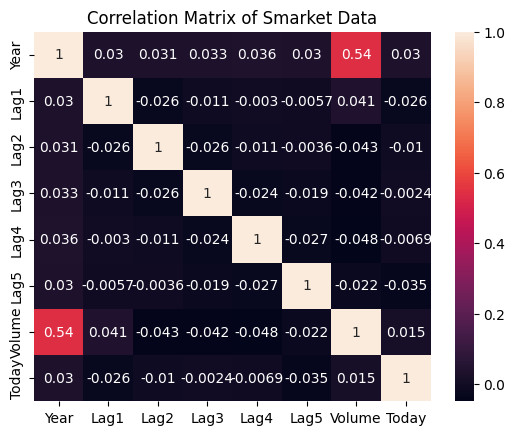

In [4]:
# plot correlation matrix with seaborn and values
sns.heatmap(Smarket.corr(), annot=True)
plt.title('Correlation Matrix of Smarket Data')
plt.show()


Next, we plot the `Volume` variable.

<Axes: >

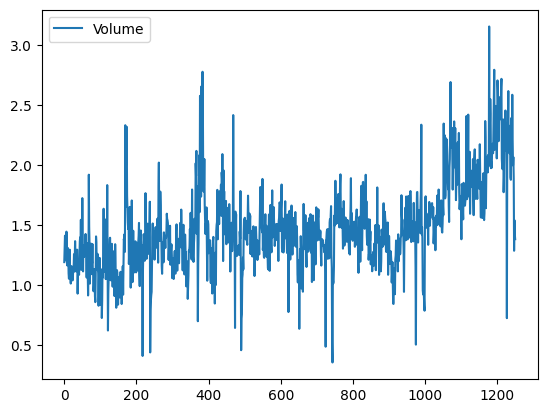

In [5]:
Smarket.plot(y='Volume')

Next, we will use logistic regression to predict the direction using lag values and volume, employing either the `sm.GLM()` or `sm.Logit()` functions from the statsmodels library.

In [6]:
allvars = Smarket.columns.drop(['Today', 'Direction', 'Year'])
design = MS(allvars)
X = design.fit_transform(Smarket)
y = Smarket.Direction == 'Up'
glm = sm.GLM(y, X, family=sm.families.Binomial())
results = glm.fit()
print(results.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:              Direction   No. Observations:                 1250
Model:                            GLM   Df Residuals:                     1243
Model Family:                Binomial   Df Model:                            6
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -863.79
Date:                Sun, 24 Mar 2024   Deviance:                       1727.6
Time:                        10:26:54   Pearson chi2:                 1.25e+03
No. Iterations:                     4   Pseudo R-squ. (CS):           0.002868
Covariance Type:            nonrobust                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept     -0.1260      0.241     -0.523      0.6

We can utilize the fitted logistic regression model to predict outcomes. For instance, we can predict the next seven outcomes as follows:

In [7]:
probs = results.predict(X)
probs[:7]

0    0.507084
1    0.481468
2    0.481139
3    0.515222
4    0.510781
5    0.506956
6    0.492651
dtype: float64

The confusion_table() function summarizes the predictions, displaying the correct and incorrect classifications, adapted from sklearn.metrics, with arguments for predicted and true labels, and will be applied to analyze the "Up" and "Down" variables.

In [8]:
labels = (probs > 0.5).map({True: 'Up', False: 'Down'})
confusion_table(labels , Smarket.Direction)

Truth,Down,Up
Predicted,,
Down,145,141
Up,457,507


In [9]:
# Calculate accuracy and error rates
accuracy_rate = round(np.mean(labels == Smarket.Direction), 4)
error_rate = round(1 - accuracy_rate, 4)

# Print accuracy and error rates with labels
print(f"Accuracy Rate: {accuracy_rate}, Error Rate: {error_rate}")

Accuracy Rate: 0.5216, Error Rate: 0.4784


The logistic regression model initially shows promising performance but requires further evaluation as it was trained and tested on the same dataset, leading to a potentially overly optimistic training error rate, prompting the need for cross-validation by partitioning the data into training and test sets to assess the model's predictive accuracy.

In [10]:
# conduct a logistic regression using sklearn where train data is 2000-2004 and test data is 2005
train = (Smarket.Year < 2005)
Smarket_train = Smarket[train]
Smarket_test = Smarket[~train]
Smarket_train.shape, Smarket_test.shape

((998, 9), (252, 9))

In [11]:
X_train, X_test = X[train], X[~train]
y_train, y_test = y[train], y[~train]

glm_train = sm.GLM(y_train, X_train, family=sm.families.Binomial())
results_train = glm_train.fit()
print(results_train.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:              Direction   No. Observations:                  998
Model:                            GLM   Df Residuals:                      991
Model Family:                Binomial   Df Model:                            6
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -690.55
Date:                Sun, 24 Mar 2024   Deviance:                       1381.1
Time:                        10:26:54   Pearson chi2:                     998.
No. Iterations:                     4   Pseudo R-squ. (CS):           0.002162
Covariance Type:            nonrobust                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.1912      0.334      0.573      0.5

In [12]:
probs_test = results_train.predict(exog=X_test)

D = Smarket.Direction
L_train , L_test = D[train], D[~train]
labels_test = (probs_test > 0.5).map({True: 'Up', False: 'Down'})
confusion_table(labels_test, L_test)

Truth,Down,Up
Predicted,,
Down,77,97
Up,34,44


In [13]:
# Calculate accuracy and error rates
accuracy_rate = round(np.mean(labels_test == Smarket_test.Direction), 4)
error_rate = round(np.mean(labels_test != Smarket_test.Direction), 4)

# Print accuracy and error rates with labels
print(f"Accuracy Rate: {accuracy_rate}, Error Rate: {error_rate}")


Accuracy Rate: 0.4802, Error Rate: 0.5198


In an attempt to improve the logistic regression model's performance, we refit the model using only `Lag1` and `Lag2` predictors, which exhibited the highest predictive power among the variables.

In [14]:
model = MS(['Lag1', 'Lag2']).fit(Smarket)
X = model.transform(Smarket)
X_train, X_test = X.loc[train], X.loc[~train]
glm_train = sm.GLM(y_train, X_train, family=sm.families.Binomial())
results_train = glm_train.fit()
print(results_train.summary())

                 Generalized Linear Model Regression Results                  
Dep. Variable:              Direction   No. Observations:                  998
Model:                            GLM   Df Residuals:                      995
Model Family:                Binomial   Df Model:                            2
Link Function:                  Logit   Scale:                          1.0000
Method:                          IRLS   Log-Likelihood:                -690.70
Date:                Sun, 24 Mar 2024   Deviance:                       1381.4
Time:                        10:26:54   Pearson chi2:                     998.
No. Iterations:                     4   Pseudo R-squ. (CS):           0.001865
Covariance Type:            nonrobust                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
intercept      0.0322      0.063      0.508      0.6

In [15]:
labels_lag = np.array(['Down']*len(y_train))
labels_lag[results_train.mu > 0.5] = 'Up'
confusion_table(labels_lag, Smarket_train.Direction)

Truth,Down,Up
Predicted,,
Down,168,160
Up,323,347


In [16]:
# print accuracy and error rates
accuracy_rate = round(np.mean(labels_lag == Smarket_train.Direction), 4)
error_rate = round(1 - accuracy_rate, 4)
print(f"Accuracy Rate: {accuracy_rate}, Error Rate: {error_rate}")

Accuracy Rate: 0.516, Error Rate: 0.484


In [17]:
# test the model with new data
newData = pd.DataFrame({'Lag1': [1.2, 1.5], 'Lag2': [1.1, -0.8]})
newX = model.transform(newData)

# Predict probabilities for new data
probabilities = results_train.predict(newX)

# Concatenate lag names with probabilities
result_df = pd.DataFrame({'Variable': ['Lag1', 'Lag2'],
                          'Probability': probabilities})
result_df


,Variable,Probability
0,Lag1,0.479146
1,Lag2,0.496094


# On to the next one ➜

Next, we will delve into `Linear Discriminant Analysis`.

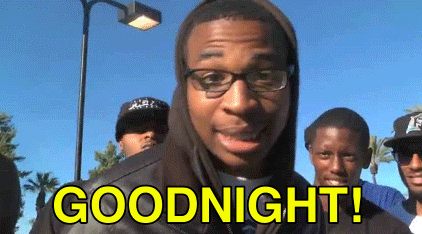